In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/coco-2017-dataset/coco2017/val2017/000000011197.jpg
/kaggle/input/coco-2017-dataset/coco2017/val2017/000000219485.jpg
/kaggle/input/coco-2017-dataset/coco2017/val2017/000000151000.jpg
/kaggle/input/coco-2017-dataset/coco2017/val2017/000000371677.jpg
/kaggle/input/coco-2017-dataset/coco2017/val2017/000000038825.jpg
/kaggle/input/coco-2017-dataset/coco2017/val2017/000000384527.jpg
/kaggle/input/coco-2017-dataset/coco2017/val2017/000000122969.jpg
/kaggle/input/coco-2017-dataset/coco2017/val2017/000000028809.jpg
/kaggle/input/coco-2017-dataset/coco2017/val2017/000000053505.jpg
/kaggle/input/coco-2017-dataset/coco2017/val2017/000000384513.jpg
/kaggle/input/coco-2017-dataset/coco2017/val2017/000000356531.jpg
/kaggle/input/coco-2017-dataset/coco2017/val2017/000000106563.jpg
/kaggle/input/coco-2017-dataset/coco2017/val2017/000000125257.jpg
/kaggle/input/coco-2017-dataset/coco2017/val2017/000000259571.jpg
/kaggle/input/coco-2017-dataset/coco2017/val2017/000000568690.jpg
/kaggle/in

In [1]:
import kagglehub


In [2]:
coco_2017_dataset_path = kagglehub.dataset_download('awsaf49/coco-2017-dataset')

In [6]:
import torch
from torchvision.datasets import CocoDetection
from torchvision.models.detection import ssdlite320_mobilenet_v3_large
from torchvision.transforms import functional as F
from torch.utils.data import DataLoader, Subset
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import random
import json


# 1. Configuration & Setup

In [7]:
DATA_ROOT = '/kaggle/input/coco-2017-dataset/coco2017/val2017'  # COCO val2017 images path
ANNOTATIONS_FILE = '/kaggle/input/coco-2017-dataset/coco2017/annotations/instances_val2017.json'  # COCO val2017 annotations
BATCH_SIZE = 4
NUM_CLASSES = 91  # COCO classes + background
DEVICE = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
NUM_EPOCHS = 5  # Limited epochs for demonstration

# 2. Dataset & Transforms


In [8]:
def transforms(img):
    """Convert PIL image to tensor."""
    return F.to_tensor(img)

class CocoDatasetFiltered(CocoDetection):
    """
    COCO Dataset that converts annotations and filters images without annotations.
    """
    def __init__(self, root, annFile, transforms=None):
        super().__init__(root, annFile)
        self._transforms = transforms
        self.coco = COCO(annFile)

    def __getitem__(self, idx):
        img, target = super().__getitem__(idx)
        image_id = self.ids[idx]

        boxes = []
        labels = []
        for obj in target:
            bbox = obj['bbox']
            boxes.append([bbox[0], bbox[1], bbox[0] + bbox[2], bbox[1] + bbox[3]])
            labels.append(obj['category_id'])

        boxes = torch.tensor(boxes, dtype=torch.float32)
        labels = torch.tensor(labels, dtype=torch.int64)

        target = {
            "boxes": boxes,
            "labels": labels,
            "image_id": torch.tensor([image_id])
        }

        if self._transforms:
            img = self._transforms(img)

        return img, target


# 3. Prepare Dataset Subset

In [9]:
dataset_full = CocoDatasetFiltered(DATA_ROOT, ANNOTATIONS_FILE, transforms=transforms)

# Filter out images with no annotations to prevent errors
valid_indices = []
for i in range(len(dataset_full)):
    _, target = dataset_full[i]
    if target['boxes'].numel() > 0:
        valid_indices.append(i)

# Shuffle and select 10% of dataset for faster training/testing
random.seed(42)
random.shuffle(valid_indices)
sample_size = int(0.5 * len(valid_indices))
valid_indices_10pct = valid_indices[:sample_size]

dataset = Subset(dataset_full, valid_indices_10pct)

def collate_fn(batch):
    """Custom collate function to handle batches."""
    imgs = []
    targets = []
    for sample in batch:
        imgs.append(sample[0])
        targets.append(sample[1])
    return imgs, targets

data_loader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True, collate_fn=collate_fn)



loading annotations into memory...
Done (t=0.46s)
creating index...
index created!
loading annotations into memory...
Done (t=0.44s)
creating index...
index created!


# 4. Model


In [10]:
model = ssdlite320_mobilenet_v3_large(pretrained=True)
model.to(DEVICE)
model.train()
print(model.head)


SSDLiteHead(
  (classification_head): SSDLiteClassificationHead(
    (module_list): ModuleList(
      (0): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(672, 672, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=672, bias=False)
          (1): BatchNorm2d(672, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
          (2): ReLU6(inplace=True)
        )
        (1): Conv2d(672, 546, kernel_size=(1, 1), stride=(1, 1))
      )
      (1): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(480, 480, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=480, bias=False)
          (1): BatchNorm2d(480, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
          (2): ReLU6(inplace=True)
        )
        (1): Conv2d(480, 546, kernel_size=(1, 1), stride=(1, 1))
      )
      (2): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), gro

# 5. Training

In [11]:
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

for epoch in range(NUM_EPOCHS):
    total_loss = 0
    for images, targets in data_loader:
        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        total_loss += losses.item()

    print(f"Epoch [{epoch + 1}/{NUM_EPOCHS}] - Loss: {total_loss / len(data_loader):.4f}")

# Save the model weights
torch.save(model.state_dict(), 'ssd_mobilenetv3_coco.pth')



Epoch [1/5] - Loss: 4.2726
Epoch [2/5] - Loss: 3.9184
Epoch [3/5] - Loss: 3.6247
Epoch [4/5] - Loss: 3.3719
Epoch [5/5] - Loss: 3.2064


# 6. Evaluation Functions

In [12]:
def prepare_for_coco_detection(outputs, image_ids):
    """Format model outputs for COCO evaluation."""
    coco_results = []
    for output, image_id in zip(outputs, image_ids):
        boxes = output['boxes'].cpu().detach().numpy()
        scores = output['scores'].cpu().detach().numpy()
        labels = output['labels'].cpu().detach().numpy()

        for box, score, label in zip(boxes, scores, labels):
            x_min, y_min, x_max, y_max = box
            width = x_max - x_min
            height = y_max - y_min
            coco_results.append({
                "image_id": int(image_id.item()),
                "category_id": int(label),
                "bbox": [float(x_min), float(y_min), float(width), float(height)],
                "score": float(score),
            })
    return coco_results


# 7. Evaluation Run


In [13]:
model.eval()
coco_gt = COCO(ANNOTATIONS_FILE)

results = []
image_ids = []

with torch.no_grad():
    eval_loader = DataLoader(dataset, batch_size=BATCH_SIZE, collate_fn=collate_fn)
    for images, targets in eval_loader:
        images = list(img.to(DEVICE) for img in images)
        outputs = model(images)
        image_ids += [t["image_id"] for t in targets]
        results.extend(prepare_for_coco_detection(outputs, [t["image_id"] for t in targets]))

with open("ssd_mobilenetv3_results.json", "w") as f:
    json.dump(results, f)

coco_dt = coco_gt.loadRes("ssd_mobilenetv3_results.json")
coco_eval = COCOeval(coco_gt, coco_dt, "bbox")
coco_eval.evaluate()
coco_eval.accumulate()
coco_eval.summarize()

stats = coco_eval.stats

print("\n--- COCO Evaluation Metrics ---")
print(f"mAP @[IoU=0.5:0.95]: {stats[0]:.3f}")
print(f"mAP @[IoU=0.5]: {stats[1]:.3f}")
print(f"mAP @[IoU=0.75]: {stats[2]:.3f}")
print(f"mAP @[small objects]: {stats[3]:.3f}")
print(f"mAP @[medium objects]: {stats[4]:.3f}")
print(f"mAP @[large objects]: {stats[5]:.3f}")
print(f"AR @[maxDets=100]: {stats[6]:.3f}")
print(f"AR @[small objects]: {stats[7]:.3f}")
print(f"AR @[medium objects]: {stats[8]:.3f}")
print(f"AR @[large objects]: {stats[9]:.3f}")

precision = stats[0]
recall = stats[6]
f1_score = 2 * (precision * recall) / (precision + recall + 1e-6)
print(f"Approximate F1 Score: {f1_score:.3f}")

print("\n--- Per-class Average Precision (AP) ---")
precisions = coco_eval.eval['precision']  # (IoU thresholds, Recall thresholds, Classes, Area ranges, Max detections)
per_class_ap = precisions[:, :, :, 0, 2].mean(axis=(0,1))  # mean over IoUs and recall

for class_id, ap in enumerate(per_class_ap):
    print(f"Class {class_id}: AP = {ap:.3f}")

loading annotations into memory...
Done (t=1.30s)
creating index...
index created!
Loading and preparing results...
DONE (t=5.61s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=35.57s).
Accumulating evaluation results...
DONE (t=6.64s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.143
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.214
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.159
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.008
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.140
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.311
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.124
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.172
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDet

# 8. Visualization Demo

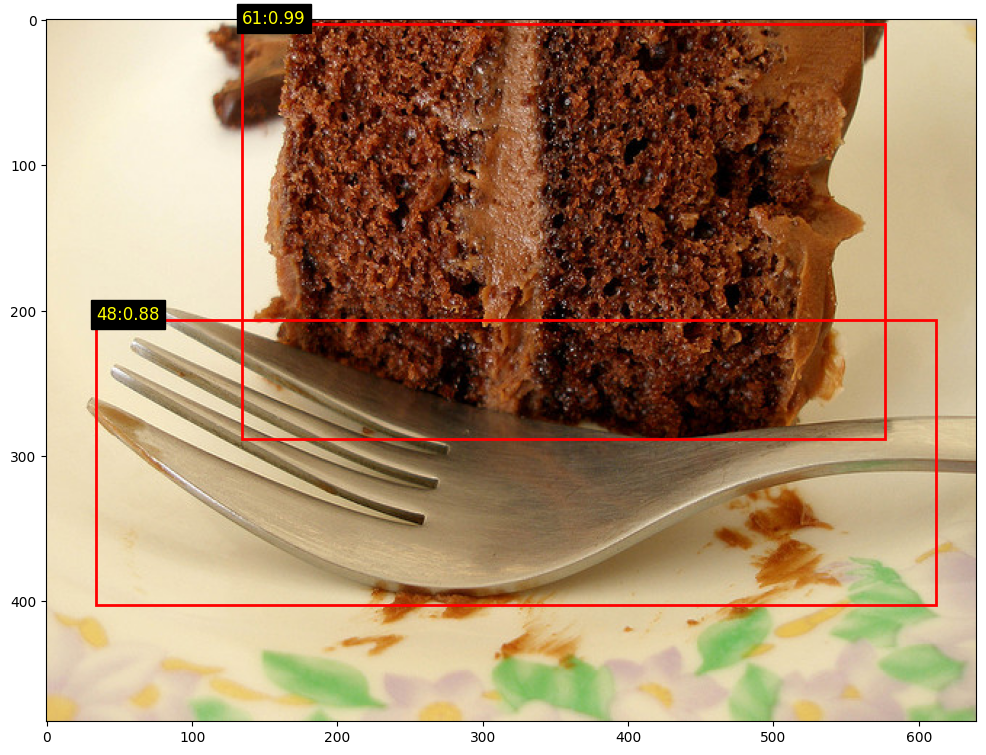

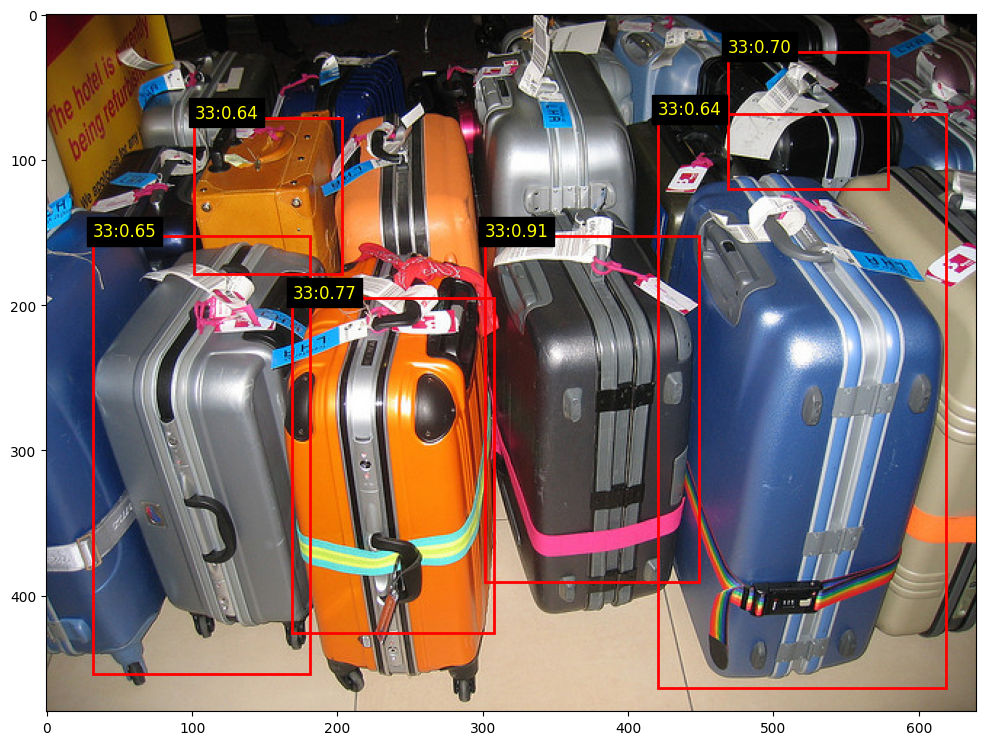

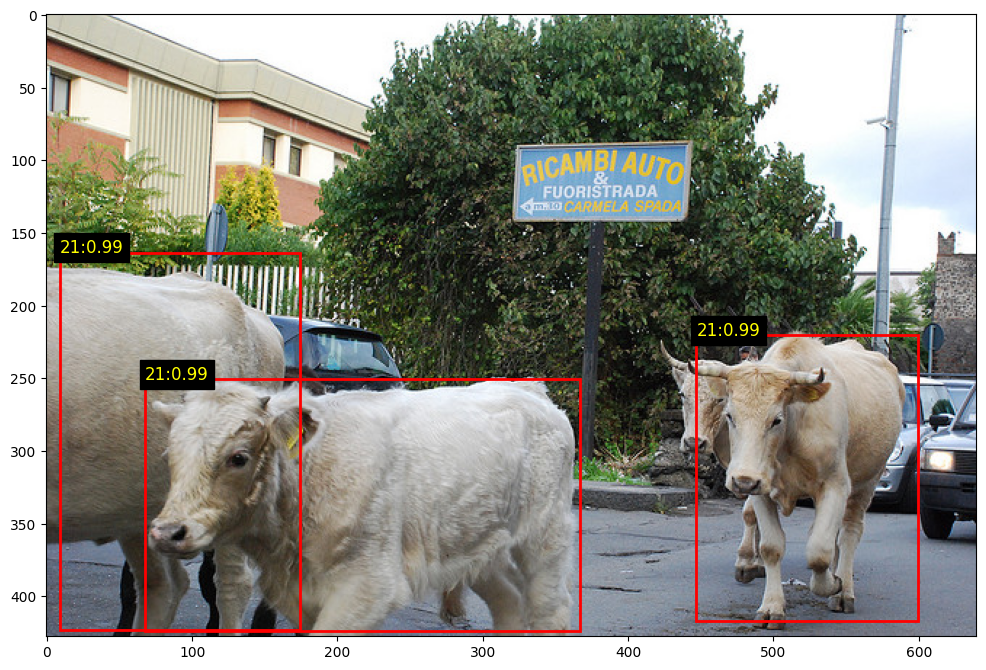

In [14]:
def show_image(img, ax):
    img = img.permute(1, 2, 0).cpu().numpy()
    ax.imshow(img)

def plot_detections(image, outputs, threshold=0.5):
    fig, ax = plt.subplots(1, 1, figsize=(12, 12))
    show_image(image, ax)

    boxes = outputs['boxes'].cpu()
    scores = outputs['scores'].cpu()
    labels = outputs['labels'].cpu()

    for box, score, label in zip(boxes, scores, labels):
        if score > threshold:
            x_min, y_min, x_max, y_max = box
            rect = patches.Rectangle(
                (x_min, y_min), x_max - x_min, y_max - y_min,
                linewidth=2, edgecolor='r', facecolor='none'
            )
            ax.add_patch(rect)
            ax.text(
                x_min, y_min, f"{label.item()}:{score:.2f}",
                color='yellow', fontsize=12, backgroundcolor='black'
            )
    plt.show()

# Visualize detection on first 3 images from dataset
model.eval()
with torch.no_grad():
    for i in range(3):
        img, target = dataset[i]
        output = model([img.to(DEVICE)])[0]
        plot_detections(img, output)